## 1. Importing data and libraries

In [2]:
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import os
from mpl_toolkits import mplot3d

from plotly.offline import download_plotlyjs, init_notebook_mode
from plotly.offline import plot, iplot
import plotly.graph_objects as go

In [3]:
#Create a path to where your data is stored.
path = r'/Users/vicky/OneDrive/文件/careerfoundry/Machine Learning with Python/Datasets'

In [4]:
#Read in the European weather data.
climate = pd.read_pickle(os.path.join(path, 'DataSet_scaled.pkl'))
climate

,id,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,0,19600101,1,0.660514,-0.02793,0.826097,-0.001949,-1.101066,-0.265148,-0.179228,...,-0.443701,0.761754,-1.299744,-0.806427,-0.088407,-0.024706,0.372147,-0.668215,-0.519743,-0.752237
1,1,19600102,1,0.244897,-0.02793,0.735760,-0.001949,-1.058108,1.658760,-0.179228,...,0.783085,1.183580,-1.262455,-1.042055,0.503361,-0.024706,-0.829285,-0.548046,-0.629054,-0.407141
2,2,19600103,1,1.076130,-0.02793,1.277781,-0.001949,-1.251420,0.155707,-0.179228,...,0.783085,1.183580,-0.432779,-1.136306,-0.396127,-0.024706,-1.009500,-0.067372,0.054135,-0.177078
3,3,19600104,1,-1.001953,-0.02793,1.458455,-0.001949,-0.821838,-0.445514,-0.179228,...,0.783085,0.480538,0.387574,-1.183432,0.669056,-0.024706,-1.039536,-0.998679,-0.164486,-0.838511
4,4,19600105,1,0.244897,-0.02793,1.729466,-0.001949,-0.746661,-0.164944,-0.179228,...,-1.670486,-0.363113,1.729970,-0.794645,-0.490810,-0.024706,0.672505,-1.509396,-1.339569,-1.471186
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,22945,20221027,10,-1.833187,-0.02793,0.284075,1.037367,-0.005632,-0.004619,-0.179228,...,-0.443701,-0.081896,-0.003958,-0.005290,-0.005560,-0.024706,-0.018319,-0.007287,-0.000520,-0.004530
22946,22946,20221028,10,0.244897,-0.02793,0.103401,0.976231,-0.005632,-0.004619,-0.179228,...,-0.443701,-0.081896,-0.003958,-0.005290,-0.005560,-0.024706,-0.018319,-0.007287,-0.000520,-0.004530
22947,22947,20221029,10,-0.586336,-0.02793,0.013064,0.716402,-0.005632,-0.004619,-0.179228,...,-0.443701,-0.081896,-0.003958,-0.005290,-0.005560,-0.024706,-0.018319,-0.007287,-0.000520,-0.004530
22948,22948,20221030,10,-0.170720,-0.02793,0.374412,0.487141,-0.005632,-0.004619,-0.179228,...,-0.443701,-0.081896,-0.003958,-0.005290,-0.005560,-0.024706,-0.018319,-0.007287,-0.000520,-0.004530


In [5]:
#Reduce to just the mean temperatures
df = climate[['DATE', 'MONTH','BASEL_temp_mean',
 'BELGRADE_temp_mean',
 'BUDAPEST_temp_mean',
 'DEBILT_temp_mean',
 'DUSSELDORF_temp_mean',
 'GDANSK_temp_mean',
 'HEATHROW_temp_mean',
 'KASSEL_temp_mean',
 'LJUBLJANA_temp_mean',
 'MAASTRICHT_temp_mean',
 'MADRID_temp_mean',
 'MUNCHENB_temp_mean',
 'OSLO_temp_mean',
 'ROMA_temp_mean',
 'SONNBLICK_temp_mean',
 'STOCKHOLM_temp_mean',
 'TOURS_temp_mean',
 'VALENTIA_temp_mean']].copy()

In [6]:
df

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
0,19600101,1,-0.528623,-1.016876,-1.099163,-0.114356,-0.105836,-0.927601,-0.106469,-0.182904,-1.370824,-0.097084,-0.988280,-0.265742,-0.186575,-1.280450,-0.124331,-0.391072,-0.257321,-0.668215
1,19600102,1,-0.582946,-1.107669,-1.110927,-0.367511,-0.370915,-0.825294,-0.892676,-0.212437,-1.043881,-0.232112,-0.691740,-0.353714,-0.368598,-0.539569,-0.650834,-0.415953,-0.335759,-0.548046
2,19600103,1,-0.257010,-1.084971,-1.063873,-0.509912,-0.532908,-0.940389,-0.490837,-0.389635,-0.741156,-0.487164,-0.853490,-0.403983,-0.550620,-0.876333,-0.650834,-0.615003,-0.210258,-0.067372
3,19600104,1,-0.555784,-1.209812,-1.146217,-0.525734,-0.577088,-1.042696,-0.316124,-0.493001,-0.910682,-0.472161,-0.624345,-0.642763,-0.417137,-0.775304,-0.943336,-0.764290,-0.069069,-0.998679
4,19600105,1,-1.003946,-1.209812,-1.087400,-0.320045,-0.444548,-0.978754,-0.403481,-0.552067,-0.862246,-0.307127,-0.381721,-0.906678,-0.332193,-0.926848,-0.621584,-0.503037,-0.037694,-1.509396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,10,0.747959,0.628750,-0.005167,0.898267,1.042841,0.440753,0.906865,-0.005705,0.481853,1.268193,0.683127,0.664244,0.395898,-0.000746,0.826301,0.517090,1.295755,-0.007287
22946,20221028,10,0.856604,0.367720,-0.005167,0.945734,1.278467,0.466330,0.802037,-0.005705,0.263891,1.313202,0.561815,0.890456,0.541516,-0.000746,1.074927,0.641496,1.358505,-0.007287
22947,20221029,10,0.856604,0.083991,-0.005167,0.914089,1.101748,0.786039,0.924336,-0.005705,0.300218,1.208181,0.548336,1.053832,0.395898,-0.000746,1.221178,0.716139,1.405568,-0.007287
22948,20221030,10,0.680055,0.265577,-0.005167,0.692578,0.880848,0.376811,0.697210,-0.005705,0.397090,0.923123,0.103526,0.689378,-0.065226,-0.000746,1.235803,0.019467,0.668249,-0.007287


In [7]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notemp = df.drop(['DATE','MONTH'], axis=1)

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18]),
 [Text(1, 0, 'BASEL_temp_mean'),
  Text(2, 0, 'BELGRADE_temp_mean'),
  Text(3, 0, 'BUDAPEST_temp_mean'),
  Text(4, 0, 'DEBILT_temp_mean'),
  Text(5, 0, 'DUSSELDORF_temp_mean'),
  Text(6, 0, 'GDANSK_temp_mean'),
  Text(7, 0, 'HEATHROW_temp_mean'),
  Text(8, 0, 'KASSEL_temp_mean'),
  Text(9, 0, 'LJUBLJANA_temp_mean'),
  Text(10, 0, 'MAASTRICHT_temp_mean'),
  Text(11, 0, 'MADRID_temp_mean'),
  Text(12, 0, 'MUNCHENB_temp_mean'),
  Text(13, 0, 'OSLO_temp_mean'),
  Text(14, 0, 'ROMA_temp_mean'),
  Text(15, 0, 'SONNBLICK_temp_mean'),
  Text(16, 0, 'STOCKHOLM_temp_mean'),
  Text(17, 0, 'TOURS_temp_mean'),
  Text(18, 0, 'VALENTIA_temp_mean')])

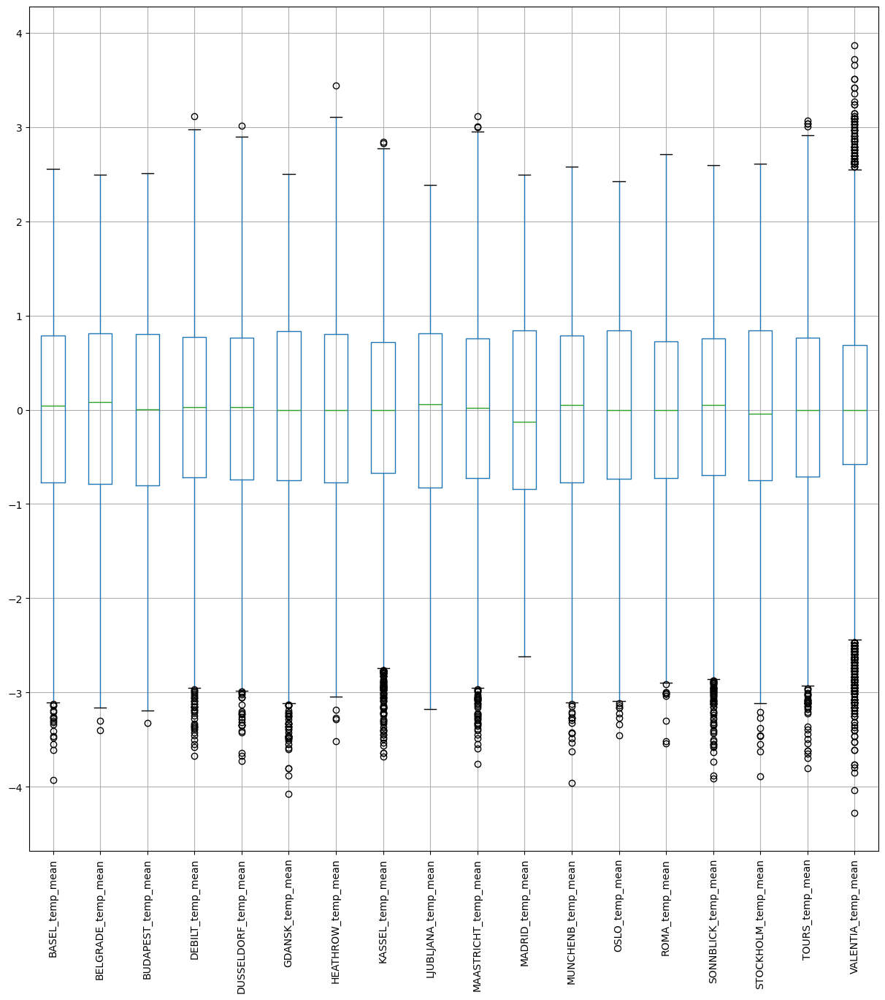

In [8]:
#Look at a whisker plot of the data to see variations in temperatures
notemp.boxplot(figsize=(15,15))
plt.xticks(rotation=90)

## 2. Reduce Dateset to one year and one weather station (2021 Debilt)

In [9]:
#Reduce the dataset to 2021
df2021 = df[df['DATE'].astype(str).str.contains('^2021')] #select 2021 data HERE
df2021

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
22281,20210101,1,-1.112591,-0.653703,-0.005167,-1.111156,-1.239786,-1.272886,-1.713826,-0.005705,-0.995445,-1.222313,-1.473528,-1.107756,-0.744778,-0.000746,-1.206588,-0.540359,-1.496644,-0.007287
22282,20210102,1,-1.221236,-0.551561,-0.005167,-1.016223,-1.195607,-1.081061,-1.504171,-0.005705,-0.741156,-1.282325,-1.716151,-1.271132,-0.671969,-0.000746,-0.884835,-0.702087,-1.763333,-0.007287
22283,20210103,1,-1.384204,-0.415371,-0.005167,-1.063690,-1.136700,-1.042696,-1.381872,-0.005705,-0.862246,-1.207310,-1.608319,-1.208295,-0.951071,-0.000746,-1.016461,-0.938458,-1.465269,-0.007287
22284,20210104,1,-1.329882,-0.517514,-0.005167,-1.142801,-1.269240,-0.940389,-1.259573,-0.005705,-0.886464,-1.297328,-1.648756,-1.245997,-1.145228,-0.000746,-1.191962,-0.863814,-1.575082,-0.007287
22285,20210105,1,-1.384204,-0.699100,-0.005167,-1.126979,-1.239786,-0.799717,-1.399343,-0.005705,-0.874355,-1.267322,-1.810505,-1.296267,-1.582083,-0.000746,-1.382089,-0.975779,-1.496644,-0.007287
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22641,20211227,12,-0.515042,-1.277907,-0.005167,-0.699778,-0.621268,-2.180860,-0.473366,-0.005705,-0.910682,-0.292124,-0.368242,-0.554792,-1.812645,-0.000746,-0.606959,-1.398759,-0.037694,-0.007287
22642,20211228,12,-0.012558,-1.130368,-0.005167,-0.193467,-0.297282,-1.925093,-0.211297,-0.005705,-0.595848,-0.142094,-0.476075,-0.328579,-1.387925,-0.000746,-0.387582,-0.926017,0.025056,-0.007287
22643,20211229,12,-0.107623,-0.846639,-0.005167,-0.082711,-0.150016,-1.285675,-0.001641,-0.005705,-0.971227,-0.052075,-0.691740,-0.114934,-1.497139,-0.000746,-0.475333,-0.826492,0.134870,-0.007287
22644,20211230,12,0.354120,-0.846639,-0.005167,0.455245,0.424323,-0.876447,0.208014,-0.005705,-0.910682,0.503038,-0.691740,0.400329,-0.853992,-0.000746,0.051171,-0.577681,0.307434,-0.007287


In [10]:
df2021.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,3.650000e+02,365.000000,365.000000,365.000000,3.650000e+02,365.000000,365.000000,365.000000,365.000000,3.650000e+02,365.000000,365.000000,365.000000,365.000000,365.000000,3.650000e+02,365.000000,365.000000,365.000000,3.650000e+02
mean,2.021067e+07,6.526027,0.032909,0.128766,-5.166671e-03,0.072520,0.013712,0.088705,0.085045,-5.705221e-03,0.101863,0.062647,0.089456,0.090138,0.102767,-7.461638e-04,0.045401,0.099155,0.116518,-7.287352e-03
std,3.454755e+02,3.452584,0.949455,1.005278,2.779368e-17,0.966594,0.975583,1.066883,1.010767,2.171381e-17,1.014904,0.964474,1.009745,0.926124,1.061531,3.474209e-18,1.026706,1.048349,0.985446,1.650249e-17
min,2.021010e+07,1.000000,-2.212624,-2.049648,-5.166671e-03,-2.503513,-2.668269,-2.986526,-2.185550,-5.705221e-03,-1.855184,-2.572588,-2.470980,-2.125714,-2.152421,-7.461638e-04,-2.815348,-2.294481,-2.281025,-7.287352e-03
25%,2.021040e+07,4.000000,-0.745913,-0.631005,-5.166671e-03,-0.683956,-0.680175,-0.748564,-0.683021,-5.705221e-03,-0.704829,-0.667200,-0.664782,-0.667898,-0.574890,-7.461638e-04,-0.636209,-0.577681,-0.649512,-7.287352e-03
50%,2.021070e+07,7.000000,-0.012558,-0.040850,-5.166671e-03,0.043867,-0.061656,-0.006839,-0.001641,-5.705221e-03,-0.087270,-0.022069,-0.085181,0.035875,0.068257,-7.461638e-04,0.036546,0.019467,0.056432,-7.287352e-03
75%,2.021100e+07,10.000000,0.883765,0.935177,-5.166671e-03,0.993200,0.880848,1.029017,0.994221,-5.705221e-03,0.941995,0.923123,0.817918,0.865322,1.063315,-7.461638e-04,0.855551,0.940070,0.966314,-7.287352e-03
max,2.021123e+07,12.000000,2.078863,2.263027,-5.166671e-03,2.211512,2.559684,2.320641,2.391923,-5.705221e-03,2.092351,2.423428,2.489325,2.109492,2.082643,-7.461638e-04,2.215685,2.358296,2.111511,-7.287352e-03


In [11]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notemp2021 = df2021.drop(['DATE','MONTH'], axis=1)

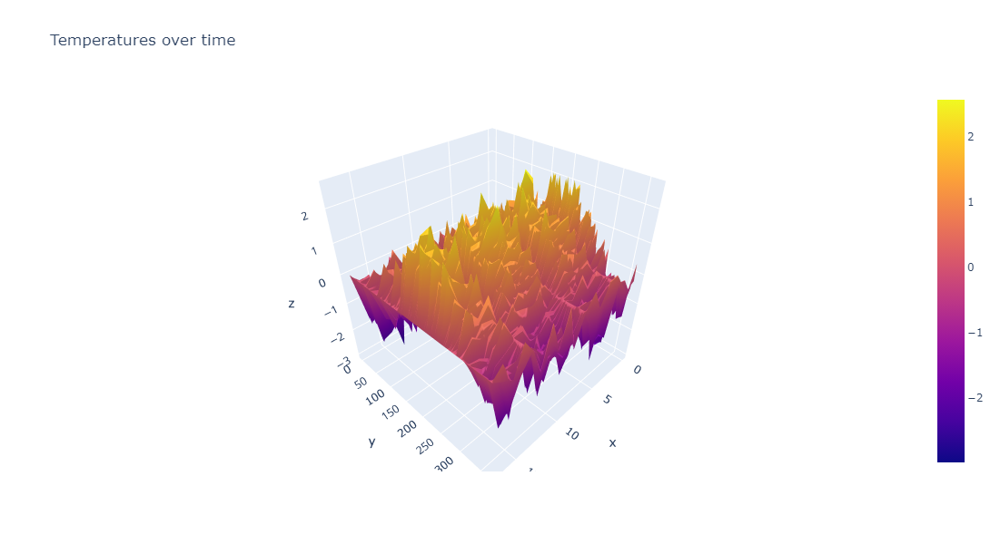

In [12]:
#Plot ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(z=notemp2021.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

In [13]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66

i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [14]:
n_rows = df2021.shape[0]
n_rows

365

In [15]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=df2021['DEBILT_temp_mean'].to_numpy().reshape(n_rows,1) #<----INSERT WEATHER STATION HERE

In [16]:
X.shape, y.shape

((365, 2), (365, 1))

In [17]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=df2021['DEBILT_temp_mean']) #<----INSERT WEATHER STATION HERE
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [18]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
df2021['DEBILT_temp_mean'].min()

-2.503512732997806

In [19]:
#what is the max temperature? (Note gradient descent is not actually finding this number)
df2021['DEBILT_temp_mean'].max()

2.2115122447500486

In [20]:
#This computes the loss function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [21]:
compute_cost(X,y)

array([0.46850143])

In [22]:
#This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [23]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=50 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[1],[1]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.1 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 0 ns
Wall time: 32 ms


In [24]:
theta

array([[-0.10088833],
       [ 0.13180733]])

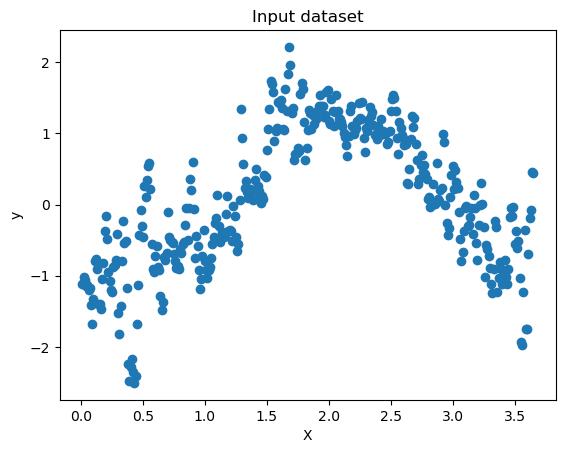

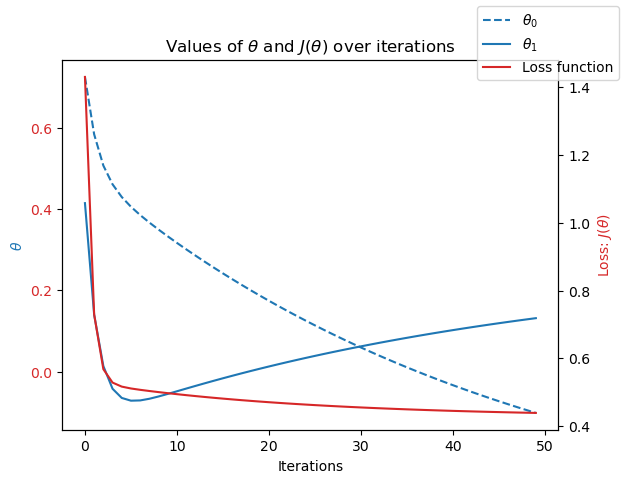

In [25]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();
plt.show()

In [26]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-10,10,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 1.48 s
Wall time: 2.21 s


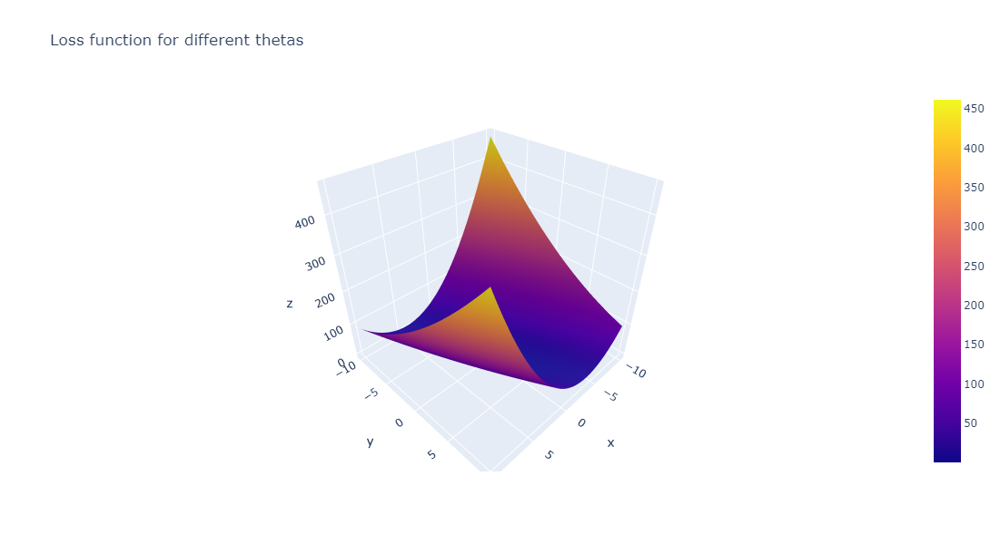

In [27]:
#This figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

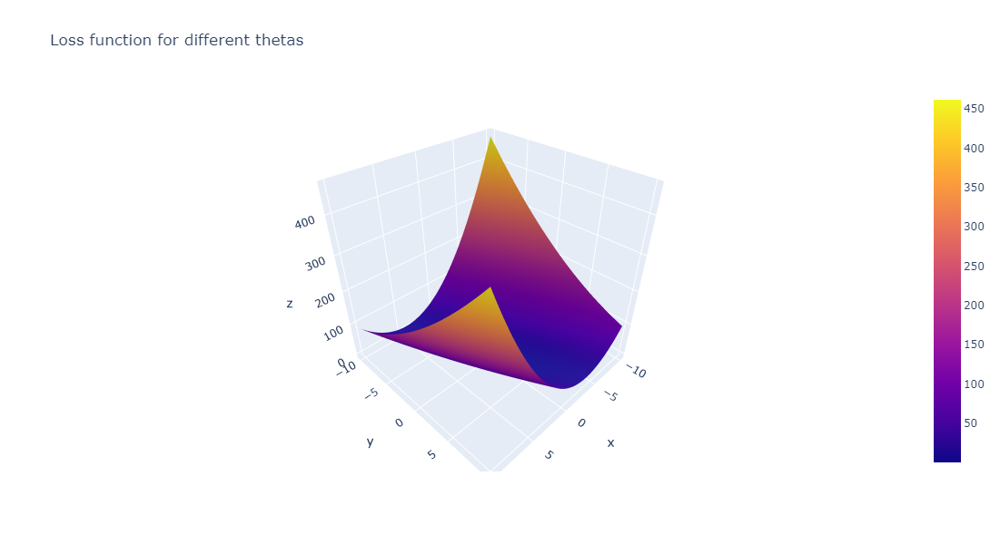

In [28]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [29]:
#Rerun the optimization above, but this time start closer to the objective!
#Find where the black line ends near the lowest X/Y/Z coordinate and make that your guess below.

num_iterations=100 #<---start with the same iterations as above
theta_init=np.array([[-0.1],[0.13]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.1 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

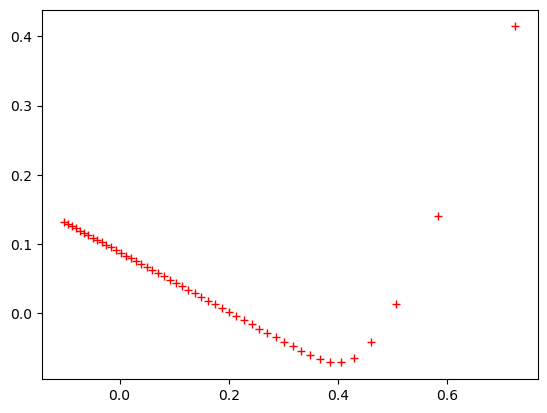

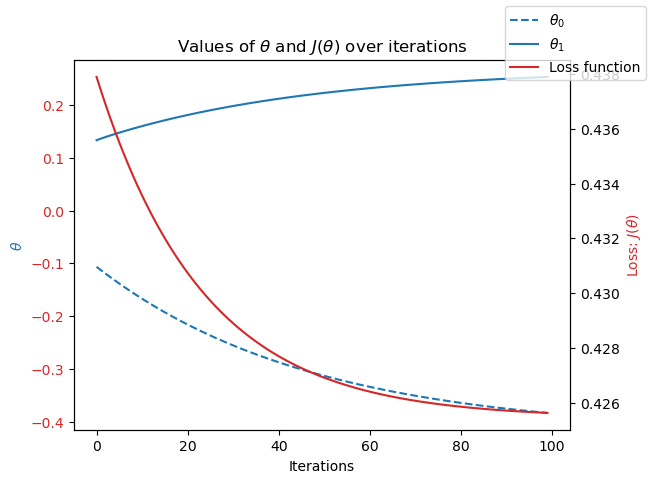

In [30]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history1, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history1, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history1, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();
plt.show()

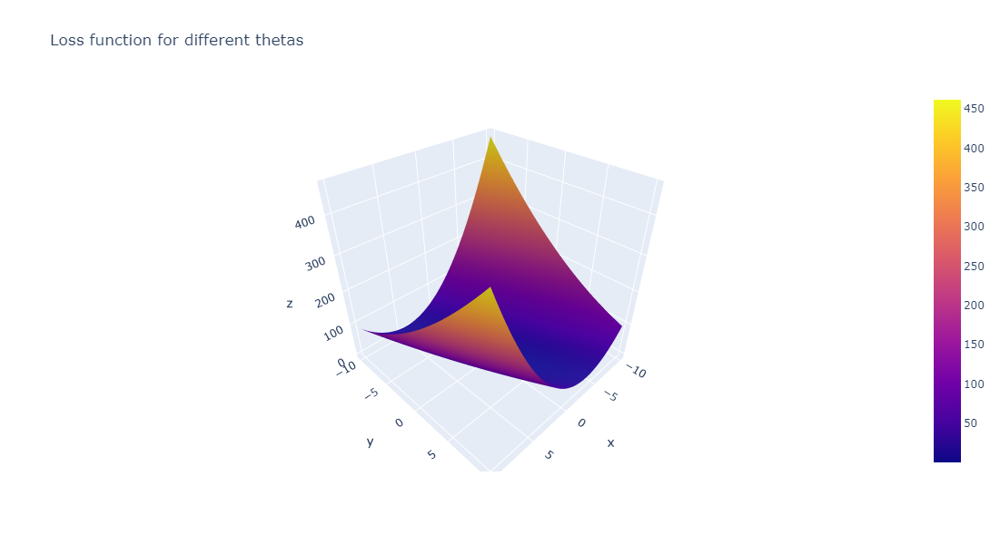

In [31]:
#Let's look at the new loss path on the function. It should start much closer to the goal

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

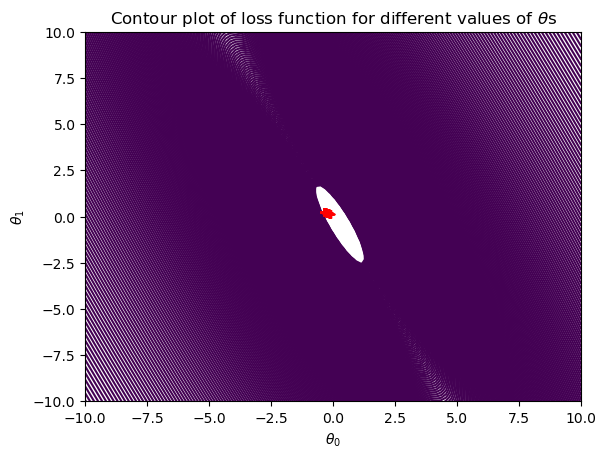

In [32]:
#This plot shows the convergence similar to above, but only in the X/Y plane (there's no height)

plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,1000))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s");
plt.plot(theta0_history1, theta1_history1, 'r+');
plt.show()

In [33]:
#How well does gradient descent converge? How much do you need to adjust between different weather stations and years?

Initial Run (50 iterations): The gradient descent starts with initial theta values of [1,1] and converges well, as indicated by the loss function decreasing smoothly and reaching a plateau around 0.4 as the number of iterations approaches 50. The final theta values are approximately [-0.10088833, 0.13180733].

Rerun (100 iterations): Here, the initial theta values are [0.1, 0.13], which are close to the final theta values from the initial run. The loss function begins close to 0.427 and remains stable throughout the 100 iterations, suggesting minimal change and indicating that the process is starting near an optimal point.

## 3. 2020 HEATHROW Data

In [34]:
#Reduce the dataset to 2021
df2020 = df[df['DATE'].astype(str).str.contains('^2020')] #select 2020 data HERE
df2020

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
21915,20200101,1,-1.465688,-1.209812,-0.934476,-1.459245,-1.387053,-0.735776,-1.102331,-0.005705,-1.370824,-1.612392,-1.123071,-1.032352,-0.550620,-0.000746,-0.153581,-0.478156,-0.869139,-0.007287
21916,20200102,1,-1.397785,-1.141717,-1.169744,-0.968756,-1.225060,-0.953178,-0.595665,-0.005705,-1.625113,-0.997267,-1.203946,-1.321402,-0.283654,-0.000746,-0.051205,-0.192023,-0.414197,-0.007287
21917,20200103,1,-0.691591,-1.357351,-1.569699,-0.383334,-0.444548,-0.799717,-0.386009,-0.005705,-1.419260,-0.397145,-1.500486,-0.693033,-0.235114,-0.000746,0.007295,-0.241785,-0.288696,-0.007287
21918,20200104,1,-0.596526,-1.504889,-1.063873,-0.525734,-0.827441,-0.556739,-0.980032,-0.005705,-1.104426,-0.772222,-1.069155,-0.592494,-0.696239,-0.000746,-0.694709,-0.615003,-0.978952,-0.007287
21919,20200105,1,-1.180494,-1.050924,-1.040346,-0.494089,-0.635995,-0.722987,-0.648078,-0.005705,-1.225516,-0.637194,-1.176988,-0.818707,-0.793317,-0.000746,-1.382089,-0.901136,-0.822076,-0.007287
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22276,20201227,12,-1.180494,-1.130368,-1.369721,-0.794712,-0.871621,-1.017119,-0.875205,-0.005705,-1.382933,-0.877243,-1.635277,-1.396806,-0.429272,-0.000746,-1.148087,-0.391072,-0.947577,-0.007287
22277,20201228,12,-0.786655,-0.528863,-0.863895,-1.016223,-0.945254,-0.710199,-1.783711,-0.005705,-1.261843,-1.087286,-1.244383,-1.095189,-0.623429,-0.000746,-1.177337,-0.391072,-1.135828,-0.007287
22278,20201229,12,-0.813817,-0.131643,-0.346305,-1.000401,-1.357599,-0.480009,-1.539113,-0.005705,-0.947009,-1.207310,-1.406132,-0.781005,-0.502081,-0.000746,-1.235838,-0.366191,-1.041702,-0.007287
22279,20201230,12,-1.058269,-0.052199,-0.499230,-0.921290,-1.048340,-0.838082,-1.521642,-0.005705,-0.934900,-1.012270,-1.365695,-0.856409,-0.574890,-0.000746,-1.279713,-0.565240,-1.120141,-0.007287


In [35]:
df2020.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,3.660000e+02,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,3.660000e+02,366.000000,366.000000,366.000000,366.000000,366.000000,3.660000e+02,366.000000,366.000000,366.000000,3.660000e+02
mean,2.020067e+07,6.513661,0.236087,0.191498,0.172345,0.263519,0.226841,0.246097,0.241620,-5.705221e-03,0.170559,0.279836,0.145252,0.250035,0.275909,-7.461638e-04,0.256961,0.295811,0.319435,-7.287352e-03
std,3.457653e+02,3.455958,0.934854,0.915643,0.923699,0.880960,0.905961,0.815164,0.974223,2.171373e-17,0.916080,0.913584,1.003402,0.875189,0.783143,3.365628e-18,0.888164,0.788996,0.922377,1.737098e-17
min,2.020010e+07,1.000000,-1.682979,-1.629730,-1.581463,-1.490890,-1.607952,-1.336828,-2.115665,-5.705221e-03,-1.625113,-1.732417,-1.635277,-1.434508,-1.290846,-7.461638e-04,-2.113343,-1.075304,-1.543707,-7.287352e-03
25%,2.020040e+07,4.000000,-0.552389,-0.560073,-0.590396,-0.430800,-0.503455,-0.425658,-0.508308,-5.705221e-03,-0.644284,-0.427152,-0.637824,-0.476246,-0.356463,-7.461638e-04,-0.292519,-0.328869,-0.414197,-7.287352e-03
50%,2.020070e+07,7.000000,0.238684,0.237205,0.177166,0.233733,0.173970,0.140227,0.103186,-5.705221e-03,0.209401,0.232983,-0.091921,0.293506,0.110729,-7.461638e-04,0.248609,0.112771,0.323121,-7.287352e-03
75%,2.020098e+07,9.750000,0.978830,0.986248,0.947669,0.898267,0.851395,0.949090,1.029164,-5.705221e-03,0.923832,0.949378,0.996516,0.953293,0.866124,-7.461638e-04,0.914051,0.949400,0.966314,-7.287352e-03
max,2.020123e+07,12.000000,2.309734,1.945251,1.935795,2.686179,2.500777,2.039297,3.038360,-5.705221e-03,1.934934,2.783501,2.327576,2.147194,2.203991,-7.461638e-04,2.230310,2.159246,2.660579,-7.287352e-03


In [36]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notemp2020 = df2020.drop(['DATE','MONTH'], axis=1)

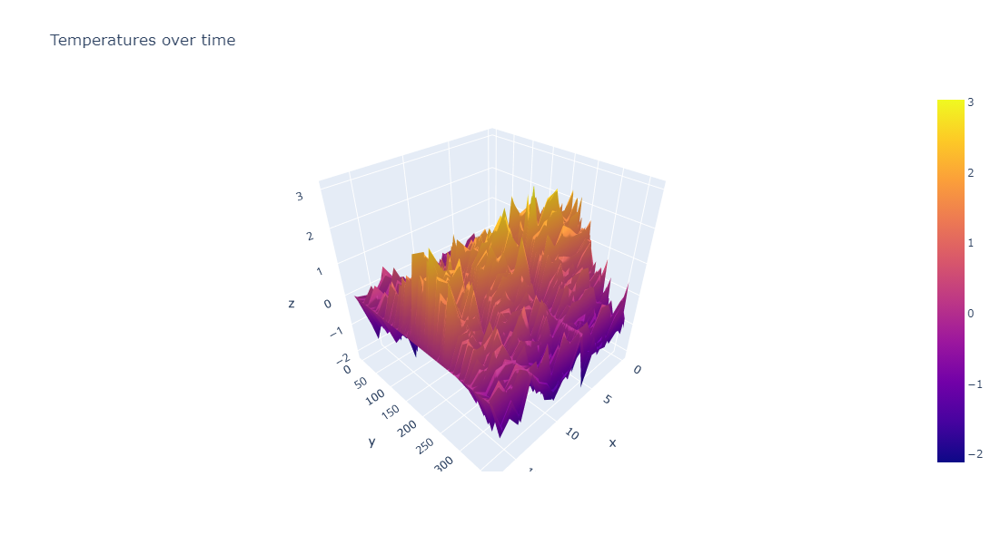

In [37]:
#Plot ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(z=notemp2020.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

In [40]:
#We need to make an index for the year. Create a set of data from 1 to 366 (2020 a leap year!)
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66

i = np.arange(0.01,3.67,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [38]:
n_rows = df2020.shape[0]
n_rows

366

In [48]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=df2020['HEATHROW_temp_mean'].to_numpy().reshape(n_rows,1) #<----INSERT WEATHER STATION HERE

In [42]:
X.shape, y.shape

((366, 2), (366, 1))

In [49]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=df2020['HEATHROW_temp_mean']) #<----INSERT WEATHER STATION HERE
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [50]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
df2020['HEATHROW_temp_mean'].min()

-2.115665056099632

In [51]:
#what is the max temperature? (Note gradient descent is not actually finding this number)
df2020['HEATHROW_temp_mean'].max()

3.0383597799658277

In [52]:
#This computes the loss function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [53]:
compute_cost(X,y)

array([0.50244867])

In [54]:
#This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [55]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=50 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[1],[1]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.1 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 15.6 ms
Wall time: 40 ms


In [56]:
theta

array([[0.18665527],
       [0.05057429]])

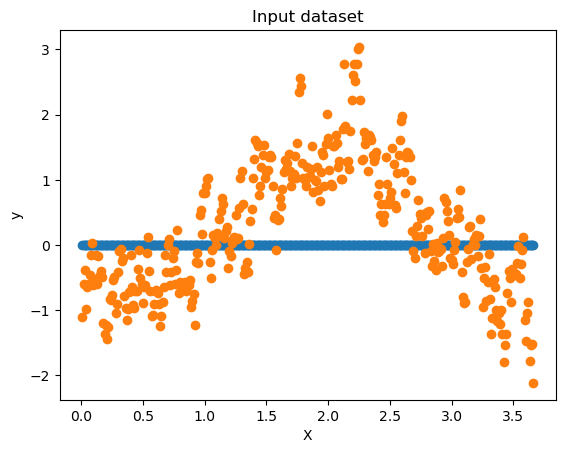

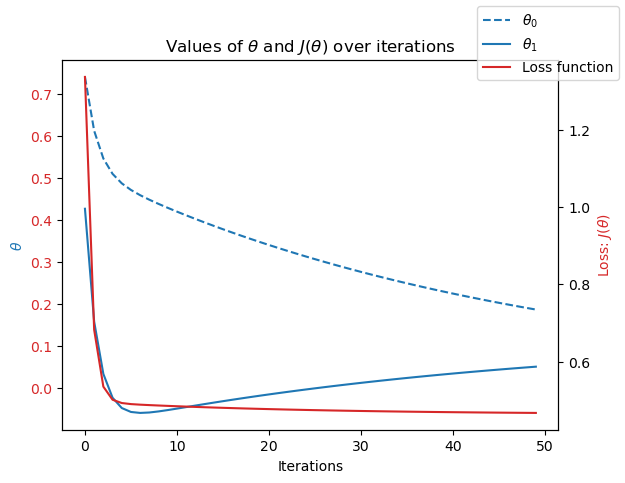

In [57]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();
plt.show()

In [58]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-10,10,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 609 ms
Wall time: 1.73 s


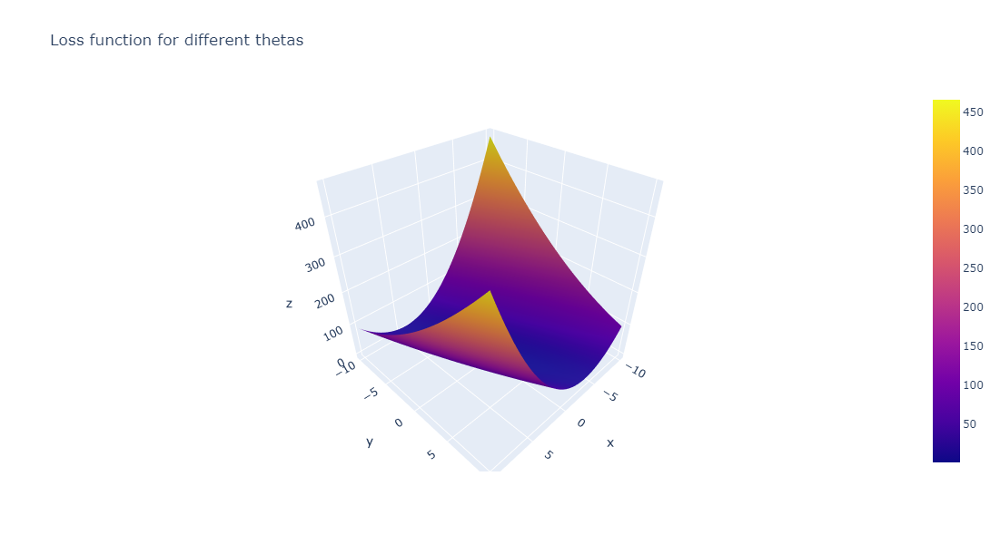

In [59]:
#This figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

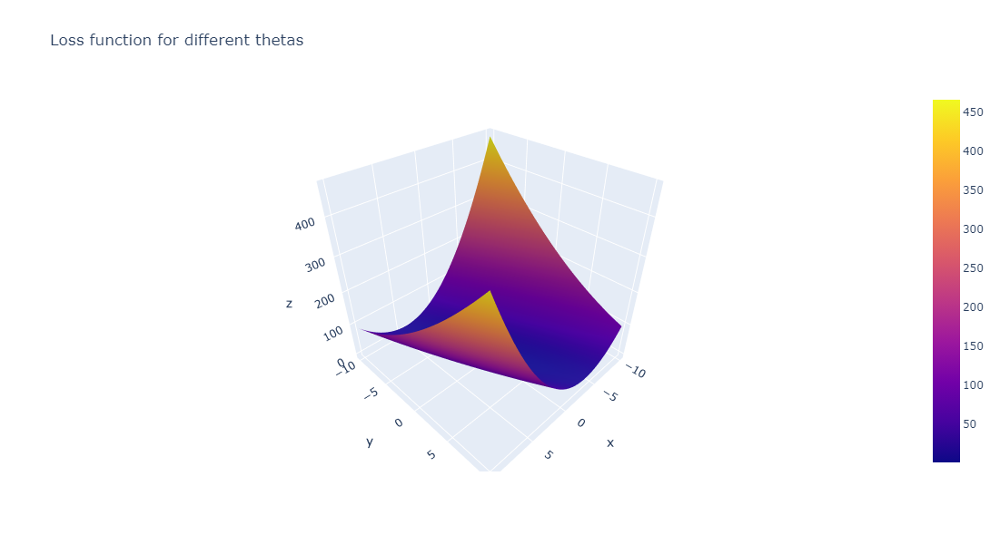

In [60]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [61]:
#Rerun the optimization above, but this time start closer to the objective!
#Find where the black line ends near the lowest X/Y/Z coordinate and make that your guess below.

num_iterations=100 #<---start with the same iterations as above
theta_init=np.array([[0.18],[0.05]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.1 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

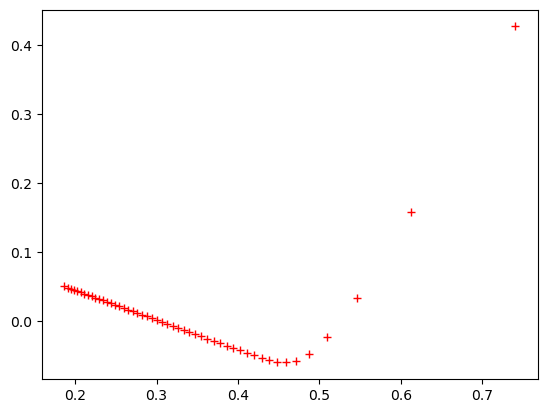

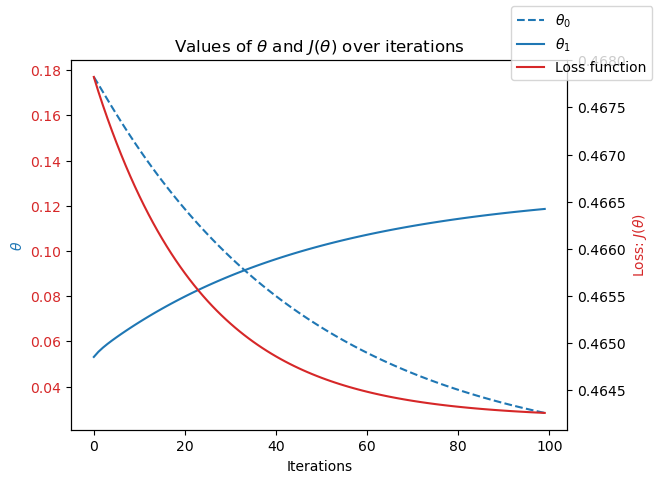

In [62]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history1, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history1, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history1, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();
plt.show()

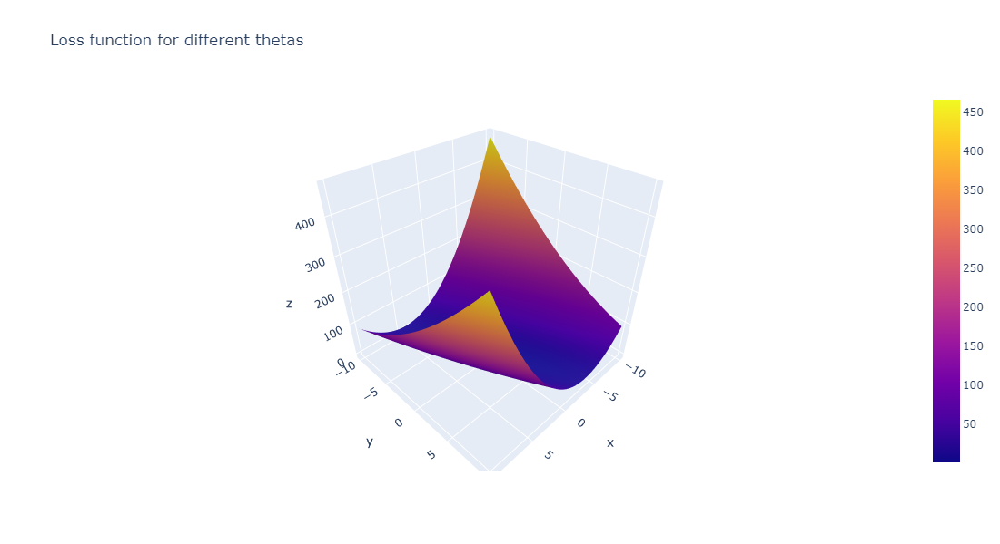

In [63]:
#Let's look at the new loss path on the function. It should start much closer to the goal

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

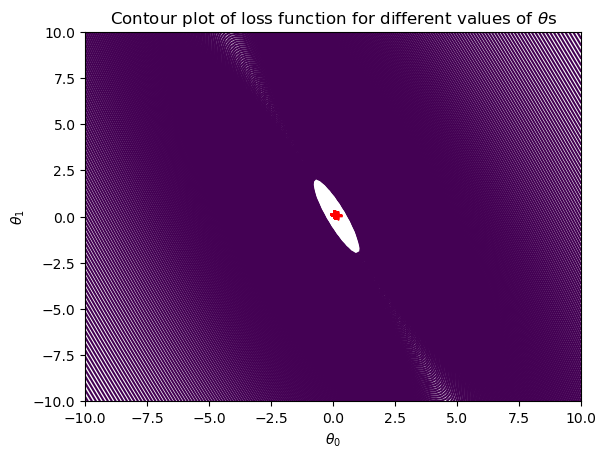

In [64]:
#This plot shows the convergence similar to above, but only in the X/Y plane (there's no height)

plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,1000))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s");
plt.plot(theta0_history1, theta1_history1, 'r+');
plt.show()

## 2019 BUDAPEST Data

In [65]:
#Reduce the dataset to 2019
df2019 = df[df['DATE'].astype(str).str.contains('^2019')] #select 2019 data HERE
df2019

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
21550,20190101,1,-0.732333,-1.232510,-1.052110,-0.367511,-0.562362,-0.352125,-0.595665,-0.005705,-1.031772,-0.592185,-1.123071,-0.617629,-0.210845,-0.000746,-0.533833,-0.391072,-0.712262,-0.007287
21551,20190102,1,-0.963204,-1.107669,-0.993293,-0.731423,-0.989434,-0.786929,-1.084860,-0.005705,-1.043881,-1.042277,-1.203946,-1.082622,-0.659834,-0.000746,-1.382089,-1.037982,-0.916201,-0.007287
21552,20190103,1,-1.452108,-1.527588,-1.475592,-0.952934,-1.048340,-0.953178,-1.102331,-0.005705,-1.104426,-1.042277,-1.028718,-1.371671,-0.659834,-0.000746,-2.508221,-1.212150,-1.324080,-0.007287
21553,20190104,1,-1.424946,-1.856713,-1.534409,-0.778890,-1.151427,-0.978754,-1.434286,-0.005705,-1.395042,-1.147298,-1.217425,-1.271132,-0.502081,-0.000746,-2.230344,-0.577681,-1.449581,-0.007287
21554,20190105,1,-1.126172,-1.731872,-1.216797,-0.478267,-0.709628,-0.607892,-1.259573,-0.005705,-1.479805,-0.757219,-1.284820,-1.132891,-0.380732,-0.000746,-1.528340,-0.838933,-1.433893,-0.007287
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21910,20191227,12,-0.487881,-1.084971,-0.863895,-1.063690,-0.945254,-0.595104,-0.648078,-0.005705,-0.934900,-0.697206,-0.813052,-0.667898,-1.375790,-0.000746,-0.884835,-1.013101,-0.084757,-0.007287
21911,20191228,12,-0.908881,-1.209812,-1.110927,-1.601646,-1.490139,-0.722987,-0.543251,-0.005705,-1.213407,-1.237316,-0.907406,-1.145458,-0.926801,-0.000746,-1.294338,-1.174829,-0.461260,-0.007287
21912,20191229,12,-1.520011,-1.368700,-1.287378,-1.395957,-1.225060,-0.799717,-0.438423,-0.005705,-1.467696,-1.357341,-0.961322,-1.333969,-0.247249,-0.000746,-1.440589,-0.565240,-1.277017,-0.007287
21913,20191230,12,-1.343462,-1.607032,-1.299141,-0.858001,-0.901074,-0.556739,-0.822791,-0.005705,-1.576677,-0.772222,-1.069155,-1.132891,-0.113766,-0.000746,-0.738584,0.094110,-1.449581,-0.007287


In [66]:
df2019.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,3.650000e+02,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,3.650000e+02,365.000000,365.000000,365.000000,365.000000,365.000000,3.650000e+02,365.000000,365.000000,365.000000,3.650000e+02
mean,2.019067e+07,6.526027,0.170502,0.282088,0.269420,0.184273,0.169048,0.244828,0.172018,-5.705221e-03,0.224877,0.194509,0.163277,0.250347,0.105426,-7.461638e-04,0.190690,0.156688,0.244511,-7.287352e-03
std,3.454755e+02,3.452584,0.976797,0.942994,0.963701,0.942226,0.986419,0.910151,0.975865,2.171381e-17,0.960609,0.968814,1.025720,0.938443,0.914662,3.474209e-18,1.031892,0.920464,0.997437,1.650249e-17
min,2.019010e+07,1.000000,-1.669398,-1.924808,-1.699097,-1.997201,-2.093931,-2.027399,-2.028309,-5.705221e-03,-1.782530,-2.047481,-1.743109,-1.685856,-2.067477,-7.461638e-04,-2.508221,-1.747095,-1.731958,-7.287352e-03
25%,2.019040e+07,4.000000,-0.555784,-0.404022,-0.463939,-0.525734,-0.577088,-0.480009,-0.595665,-5.705221e-03,-0.474758,-0.562179,-0.718699,-0.479388,-0.587025,-7.461638e-04,-0.533833,-0.540359,-0.476948,-7.287352e-03
50%,2.019070e+07,7.000000,0.096087,0.333672,0.206575,0.091333,0.026704,0.121044,0.068244,-5.705221e-03,0.154910,0.127961,-0.044744,0.199251,0.007583,-7.461638e-04,0.080421,0.031908,0.087807,-7.287352e-03
75%,2.019100e+07,10.000000,0.897346,1.003272,1.053540,0.914089,0.895575,1.016229,0.976750,-5.705221e-03,1.075195,0.908120,0.912271,0.953293,0.941966,-7.461638e-04,1.104177,0.927629,0.934939,-7.287352e-03
max,2.019123e+07,12.000000,2.540605,2.070092,2.100483,2.970979,3.016209,2.282276,3.073302,-5.705221e-03,2.225550,3.113568,2.354534,2.360839,2.288935,-7.461638e-04,2.464311,2.271212,3.037082,-7.287352e-03


In [67]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notemp2019 = df2019.drop(['DATE','MONTH'], axis=1)

In [69]:
#Plot ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(z=notemp2019.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

In [70]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66

i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [71]:
n_rows = df2019.shape[0]
n_rows

365

In [72]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=df2021['BUDAPEST_temp_mean'].to_numpy().reshape(n_rows,1) #<----INSERT WEATHER STATION HERE

In [73]:
X.shape, y.shape

((365, 2), (365, 1))

In [74]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=df2019['BUDAPEST_temp_mean']) #<----INSERT WEATHER STATION HERE
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [75]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
df2019['BUDAPEST_temp_mean'].min()

-1.6990967312093541

In [76]:
#what is the max temperature? (Note gradient descent is not actually finding this number)
df2019['BUDAPEST_temp_mean'].max()

2.1004825006015295

In [77]:
#This computes the loss function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [78]:
compute_cost(X,y)

array([1.33472457e-05])

In [79]:
#This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [80]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=50 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[1],[1]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.1 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 0 ns
Wall time: 39 ms


In [81]:
theta

array([[ 0.16112671],
       [-0.07164555]])

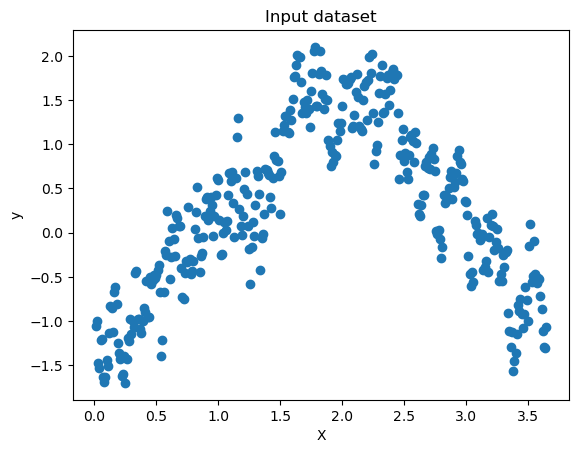

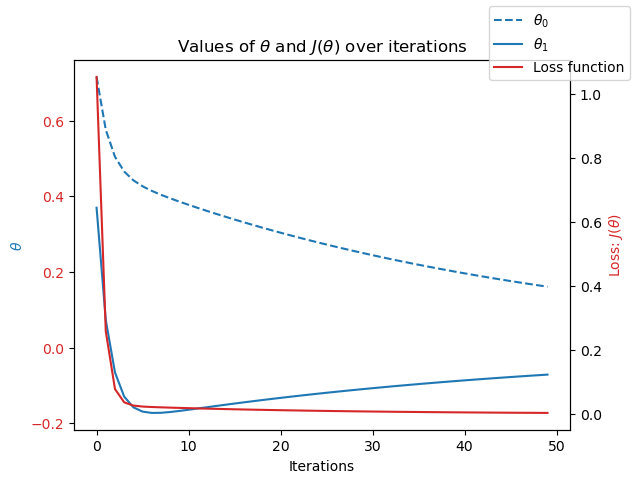

In [82]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();
plt.show()

In [83]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-10,10,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 734 ms
Wall time: 1.75 s


In [84]:
#This figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [85]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [86]:
#Rerun the optimization above, but this time start closer to the objective!
#Find where the black line ends near the lowest X/Y/Z coordinate and make that your guess below.

num_iterations=100 #<---start with the same iterations as above
theta_init=np.array([[0.16],[-0.07]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.1 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

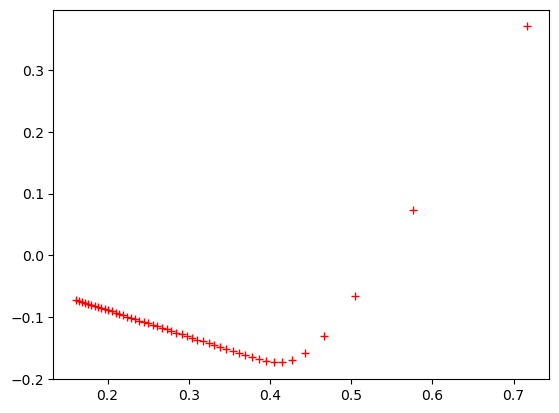

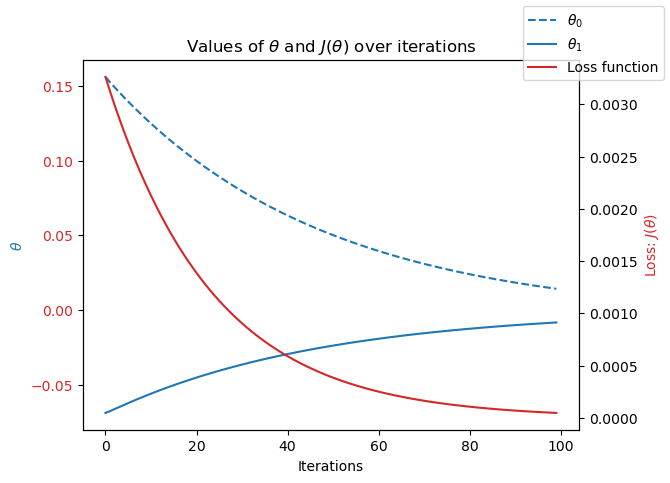

In [87]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history1, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history1, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history1, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();
plt.show()

In [88]:
#Let's look at the new loss path on the function. It should start much closer to the goal

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

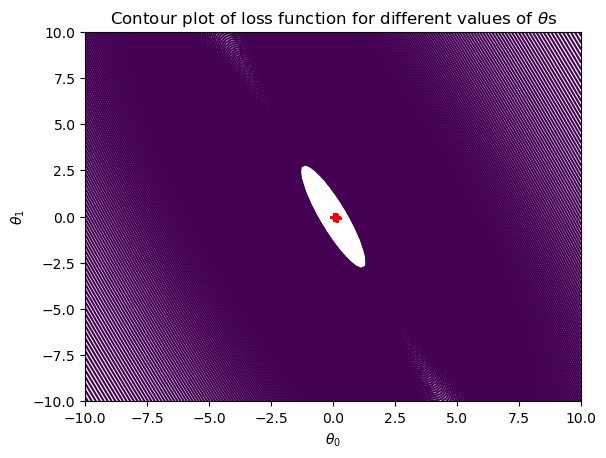

In [89]:
#This plot shows the convergence similar to above, but only in the X/Y plane (there's no height)

plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,1000))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s");
plt.plot(theta0_history1, theta1_history1, 'r+');
plt.show()

In [ ]:
#How well does gradient descent converge? How much do you need to adjust between different weather stations and years?